In [78]:
import pandas as pd
from pathlib import Path
from scripts.mutation_analysis.mutations import compute_aggregate_mutation_counter

In [79]:
GRAM_POSITIVE = [
    "S. aureus ATCC 12600",
    "S. aureus (ATCC BAA-1556) - MRSA",
    "vancomycin-resistant E. faecalis ATCC 700802",
    "vancomycin-resistant E. faecium ATCC 700221",
    "L. monocytogenes ATCC 19111 (BEIRES NR-106)",
    "C. aerofaciens ATCC25986",
    "C. scindens ATCC35704",
    "C. spiroforme ATCC29900",
    "E. rectale ATCC33656",
    "C. symbiosum",
    "R. obeum",
    "R. torques",
]

GRAM_NEGATIVE = [
    "A. baumannii ATCC 19606",
    "E. coli ATCC 11775",
    "E. coli AIG221",
    "E. coli AIG222",
    "K. pneumoniae ATCC 13883",
    "P. aeruginosa PA01",
    "P. aeruginosa PA14",
    "E. coli Nissle",
    "Salmonella enterica ATCC 9150 (BEIRES NR-515)",
    "Salmonella enterica (BEIRES NR-170)",
    "Salmonella enterica ATCC 9150 (BEIRES NR-174)",
    "A. muciniphila ATCC BAA-835",
    "B. fragilis ATCC25285",
    "B. vulgatus ATCC8482",
    "B. thetaiotaomicron ATCC29148",
    "B. thetaiotaomicron Complemmented",
    "B. thetaiotaomicron Mutant",
    "B. uniformis ATCC8492",
    "B. eggerthi ATCC27754",
    "B. ovatus ATCC8483",
    "P. distasonis ATCC8503",
    "P. copri DSMZ18205",
]

In [80]:
import numpy as np
from numba import njit
from collections import defaultdict, Counter
import pandas as pd
from tqdm import tqdm


@njit
def _find_mutation_positions(
    parent_bytes: np.ndarray,
    mutant_bytes: np.ndarray,
    ngram_size: int,
    allow_overlap: bool,
) -> np.ndarray:
    """Return start indices of differing n-grams."""
    n = len(parent_bytes)
    step = 1 if allow_overlap else ngram_size
    result = []
    for i in range(0, n - ngram_size + 1, step):
        for j in range(ngram_size):
            if parent_bytes[i + j] != mutant_bytes[i + j]:
                result.append(i)
                break
    return np.array(result, dtype=np.int64)


# def compute_aggregate_mutation_statistics(
#     diff_df,
#     parent_col: str,
#     mutant_col: str,
#     value_cols: list[str],
#     ngram_size: int,
#     allow_ngrams_overlap: bool = True,
#     use_pbar: bool = False,
#     return_counts: bool = True,
# ) -> dict:
#     """
#     Compute mean statistics for mutations. Memory-efficient incremental computation.
#     Supports both DataFrame and chunked CSV iterator.

#     Args:
#         diff_df: DataFrame or TextFileReader (from pd.read_csv with chunksize)

#     Returns:
#         {mutation_key: {col_name: mean_value, 'count': int}}
#     """
#     # Storage: mutation_key -> {col: {'sum': float, 'count': int}}
#     stats = defaultdict(lambda: {col: {"sum": 0.0, "count": 0} for col in value_cols})
#     counts = Counter() if return_counts else None

#     # Check if diff_df is a DataFrame or iterator
#     is_iterator = hasattr(diff_df, "__iter__") and not isinstance(diff_df, pd.DataFrame)

#     if is_iterator:
#         # Chunked processing
#         total_rows = 0
#         chunk_iter = diff_df
#     else:
#         # Single DataFrame
#         chunk_iter = [diff_df]
#         total_rows = len(diff_df)

#     if use_pbar:
#         pbar = tqdm(desc="Computing mutation statistics", postfix={"#keys": 0})

#     # Process chunks
#     for chunk_df in chunk_iter:
#         # Pre-extract arrays
#         parents = chunk_df[parent_col].astype(str).values
#         mutants = chunk_df[mutant_col].astype(str).values
#         valid = ~(pd.isna(chunk_df[parent_col]) | pd.isna(chunk_df[mutant_col]))
#         parents = parents[valid]
#         mutants = mutants[valid]
#         values = {
#             col: chunk_df[col].values[valid].astype(np.float64) for col in value_cols
#         }

#         # Process rows in chunk
#         for i, (p, m) in enumerate(zip(parents, mutants)):
#             if not p or not m or len(p) != len(m):
#                 continue

#             p_bytes = np.frombuffer(p.encode("utf-8"), dtype=np.uint8)
#             m_bytes = np.frombuffer(m.encode("utf-8"), dtype=np.uint8)
#             starts = _find_mutation_positions(
#                 p_bytes, m_bytes, ngram_size, allow_ngrams_overlap
#             )

#             for start in starts:
#                 key = (p[start : start + ngram_size], m[start : start + ngram_size])
#                 if key[0] != key[1]:
#                     for col in value_cols:
#                         val = values[col][i]
#                         if not np.isnan(val):
#                             stats[key][col]["sum"] += val
#                             stats[key][col]["count"] += 1
#                     if return_counts:
#                         counts[key] += 1

#             total_rows += 1
#             if use_pbar and total_rows % 100 == 0:
#                 pbar.update(100)
#                 pbar.set_postfix({"#keys": len(stats), "rows": total_rows})

#     if use_pbar:
#         pbar.close()

#     # Build result with means
#     result = {}
#     for key, col_stats in stats.items():
#         result[key] = {}
#         for col in value_cols:
#             s = col_stats[col]
#             result[key][col] = s["sum"] / s["count"] if s["count"] > 0 else np.nan
#         if return_counts:
#             result[key]["count"] = counts[key]

#     return result

In [81]:
# def compute_aggregate_mutation_statistics(
#     diff_df,
#     parent_col: str,
#     mutant_col: str,
#     value_cols: list[str],
#     ngram_size: int,
#     allow_ngrams_overlap: bool = True,
#     use_pbar: bool = False,
#     return_counts: bool = True,
#     return_samples: bool = False,
#     return_as_array: bool = True,  # If True, return numpy arrays instead of lists
# ) -> dict:
#     """
#     Compute mean statistics for mutations. Memory-efficient incremental computation.
#     Supports both DataFrame and chunked CSV iterator.

#     Args:
#         diff_df: DataFrame or TextFileReader (from pd.read_csv with chunksize)
#         return_samples: If True, return lists/arrays of all values. If False, return mean.
#         return_as_array: If True and return_samples=True, return numpy arrays instead of lists.

#     Returns:
#         {mutation_key: {col_name: mean_value | np.array([values]) | [values], 'count': int}}
#     """
#     if return_samples:
#         # Storage: mutation_key -> {col: list} (will convert to array at end)
#         stats = defaultdict(lambda: {col: [] for col in value_cols})
#     else:
#         # Storage: mutation_key -> {col: {'sum': float, 'count': int}}
#         stats = defaultdict(
#             lambda: {col: {"sum": 0.0, "count": 0} for col in value_cols}
#         )

#     counts = Counter() if return_counts else None

#     # Check if diff_df is a DataFrame or iterator
#     is_iterator = hasattr(diff_df, "__iter__") and not isinstance(diff_df, pd.DataFrame)

#     if is_iterator:
#         total_rows = 0
#         chunk_iter = diff_df
#     else:
#         chunk_iter = [diff_df]
#         total_rows = len(diff_df)

#     if use_pbar:
#         pbar = tqdm(desc="Computing mutation statistics", postfix={"#keys": 0})

#     # Process chunks
#     for chunk_df in chunk_iter:
#         # Pre-extract arrays
#         parents = chunk_df[parent_col].astype(str).values
#         mutants = chunk_df[mutant_col].astype(str).values
#         valid = ~(pd.isna(chunk_df[parent_col]) | pd.isna(chunk_df[mutant_col]))
#         parents = parents[valid]
#         mutants = mutants[valid]
#         values = {
#             col: chunk_df[col].values[valid].astype(np.float64) for col in value_cols
#         }

#         # Process rows in chunk
#         for i, (p, m) in enumerate(zip(parents, mutants)):
#             if not p or not m or len(p) != len(m):
#                 continue

#             p_bytes = np.frombuffer(p.encode("utf-8"), dtype=np.uint8)
#             m_bytes = np.frombuffer(m.encode("utf-8"), dtype=np.uint8)
#             starts = _find_mutation_positions(
#                 p_bytes, m_bytes, ngram_size, allow_ngrams_overlap
#             )

#             for start in starts:
#                 key = (p[start : start + ngram_size], m[start : start + ngram_size])
#                 if key[0] != key[1]:
#                     for col in value_cols:
#                         val = values[col][i]
#                         if not np.isnan(val):
#                             if return_samples:
#                                 # Append to list (efficient for appending)
#                                 stats[key][col].append(val)
#                             else:
#                                 # Incrementally compute mean
#                                 stats[key][col]["sum"] += val
#                                 stats[key][col]["count"] += 1
#                     if return_counts:
#                         counts[key] += 1

#             total_rows += 1
#             if use_pbar and total_rows % 100 == 0:
#                 pbar.update(100)
#                 pbar.set_postfix({"#keys": len(stats), "rows": total_rows})

#     if use_pbar:
#         pbar.close()

#     # Build result
#     result = {}
#     for key, col_stats in stats.items():
#         result[key] = {}
#         for col in value_cols:
#             if return_samples:
#                 # Convert list to numpy array for memory efficiency
#                 if return_as_array:
#                     result[key][col] = np.array(col_stats[col], dtype=np.float64)
#                 else:
#                     result[key][col] = col_stats[col]
#             else:
#                 # Return mean
#                 s = col_stats[col]
#                 result[key][col] = s["sum"] / s["count"] if s["count"] > 0 else np.nan
#         if return_counts:
#             result[key]["count"] = counts[key]

#     return result

In [82]:
def compute_aggregate_mutation_statistics(
    diff_df,
    parent_col: str,
    mutant_col: str,
    value_cols: list[str],
    ngram_size: int,
    allow_ngrams_overlap: bool = True,
    use_pbar: bool = False,
    return_counts: bool = True,
    return_samples: bool = False,
    return_as_array: bool = True,
) -> dict:
    """
    Compute mean statistics for mutations. Memory-efficient incremental computation.
    Supports both DataFrame and chunked CSV iterator.

    Args:
        diff_df: DataFrame or TextFileReader (from pd.read_csv with chunksize)
        return_samples: If True, return lists/arrays of all values. If False, return mean.
        return_as_array: If True and return_samples=True, return numpy arrays instead of lists.

    Returns:
        {mutation_key: {col_name: mean_value | np.array([values]) | [values], 'count': int}}
    """
    if return_samples:
        stats = defaultdict(lambda: {col: [] for col in value_cols})
        total_samples = 0
    else:
        stats = defaultdict(
            lambda: {col: {"sum": 0.0, "count": 0} for col in value_cols}
        )

    counts = Counter() if return_counts else None

    # Check if diff_df is a DataFrame or iterator
    is_iterator = hasattr(diff_df, "__iter__") and not isinstance(diff_df, pd.DataFrame)

    if is_iterator:
        total_rows = 0
        chunk_iter = diff_df
        total_known = None
    else:
        chunk_iter = [diff_df]
        total_rows = 0
        total_known = len(diff_df)

    # Create progress bar once
    if use_pbar:
        if total_known:
            pbar = tqdm(
                total=total_known,
                desc="Computing mutation statistics",
                postfix={"#keys": 0, "rows": 0},
                unit="row",
            )
        else:
            pbar = tqdm(
                desc="Computing mutation statistics",
                postfix={"#keys": 0, "rows": 0},
                unit="row",
            )

    # Process chunks
    for chunk_df in chunk_iter:
        # Pre-extract arrays
        parents = chunk_df[parent_col].astype(str).values
        mutants = chunk_df[mutant_col].astype(str).values
        valid = ~(pd.isna(chunk_df[parent_col]) | pd.isna(chunk_df[mutant_col]))
        parents = parents[valid]
        mutants = mutants[valid]
        values = {
            col: chunk_df[col].values[valid].astype(np.float64) for col in value_cols
        }

        # Process rows in chunk
        for i, (p, m) in enumerate(zip(parents, mutants)):
            if not p or not m or len(p) != len(m):
                continue

            p_bytes = np.frombuffer(p.encode("utf-8"), dtype=np.uint8)
            m_bytes = np.frombuffer(m.encode("utf-8"), dtype=np.uint8)
            starts = _find_mutation_positions(
                p_bytes, m_bytes, ngram_size, allow_ngrams_overlap
            )

            for start in starts:
                key = (p[start : start + ngram_size], m[start : start + ngram_size])
                if key[0] != key[1]:
                    for col in value_cols:
                        val = values[col][i]
                        if not np.isnan(val):
                            if return_samples:
                                stats[key][col].append(val)
                                total_samples += 1
                            else:
                                stats[key][col]["sum"] += val
                                stats[key][col]["count"] += 1
                    if return_counts:
                        counts[key] += 1

            total_rows += 1
            # Update progress bar
            if use_pbar:
                update_freq = 10 if return_samples else 100
                if total_rows % update_freq == 0:
                    if return_samples:
                        pbar.set_postfix(
                            {
                                "#keys": len(stats),
                                "rows": total_rows,
                                "samples": total_samples,
                            }
                        )
                    else:
                        pbar.set_postfix({"#keys": len(stats), "rows": total_rows})
                    # Only update the counter, not create new bars
                    if total_known:
                        pbar.n = total_rows
                        pbar.refresh()
                    else:
                        pbar.update(update_freq)

    # Final update
    if use_pbar:
        if total_known:
            pbar.n = total_rows
        if return_samples:
            pbar.set_postfix(
                {"#keys": len(stats), "rows": total_rows, "samples": total_samples}
            )
        else:
            pbar.set_postfix({"#keys": len(stats), "rows": total_rows})
        pbar.close()

    # Build result
    result = {}
    for key, col_stats in stats.items():
        result[key] = {}
        for col in value_cols:
            if return_samples:
                if return_as_array:
                    result[key][col] = np.array(col_stats[col], dtype=np.float64)
                else:
                    result[key][col] = col_stats[col]
            else:
                s = col_stats[col]
                result[key][col] = s["sum"] / s["count"] if s["count"] > 0 else np.nan
        if return_counts:
            result[key]["count"] = counts[key]

    return result

In [83]:
diff_values_path = Path(
    "/home/prz/bioml/pep-compass/results/mutation_analysis/hydramp_x_ampsphere/direction_threshold=0.001_token_threshold=0.1_jacobian_mode=approx_jacobian_eps=0.05/ngram1/diff_values.csv"
)
diff_df = pd.read_csv(diff_values_path, chunksize=100, iterator=True, low_memory=True)

In [84]:
samples_log2_diff = compute_aggregate_mutation_statistics(
    diff_df=diff_df,
    parent_col="parent",
    mutant_col="mutant",
    value_cols=[f"{b}_log2_diff" for b in GRAM_POSITIVE + GRAM_NEGATIVE],
    ngram_size=3,
    use_pbar=True,
    return_samples=True,
    return_as_array=True,
)

Computing mutation statistics: 303270row [01:53, 2665.33row/s, #keys=106265, rows=303273, samples=2.66e+7]


In [85]:
# TODO: @pszmk add the log2 values via for instance preprocessing wrapper?
# samples_log2 = compute_aggregate_mutation_statistics(
#     diff_df=diff_df,
#     parent_col="parent",
#     mutant_col="mutant",
#     value_cols=[f"{b}_log2" for b in GRAM_POSITIVE],
#     ngram_size=3,
#     use_pbar=True,
#     return_samples=True,
#     return_as_array=True,
# )

In [86]:
import numpy as np
from scipy.stats import mannwhitneyu, wilcoxon
from statsmodels.stats.multitest import multipletests
from typing import Callable, Optional


def aggregate_mutation_dict_stats(
    data_dict: dict,
    value_key: str | None = None,
    subset: list[str] | None = None,
    agg_func: Callable | None = np.mean,
    agg_func_kwargs: dict | None = None,
) -> dict:
    """
    Aggregates mutation dictionaries and returns mean, std, and n as dict.

    Parameters
    ----------
    data_dict : dict
        Full mutation dictionary with structure:
        { (from_aa, to_aa): { value_key: { variable_name: list_of_values } } }
    value_key : str, optional
        The inner key to aggregate over (e.g. "diff"). If None, assumes data_dict
        has structure { (from_aa, to_aa): { variable_name: list_of_values } }.
    subset : list of str, optional
        List of variable names to include (e.g. species names). If None, includes all.
    agg_func : callable, default np.mean
        Aggregation function to apply over the subset variables.
    agg_func_kwargs : dict, optional
        Additional keyword arguments to pass to the aggregation function.

    Returns
    -------
    dict
        Dictionary with structure:
        { (from_aa, to_aa): {'mean': float, 'std': float, 'n': int} }
    """
    if agg_func_kwargs is None:
        agg_func_kwargs = {}

    result = {}

    for (aa1, aa2), record in data_dict.items():
        # Handle optional value_key
        if value_key is not None:
            if value_key not in record:
                continue
            value_dict = record[value_key]
        else:
            value_dict = record

        all_values = []

        # Include only selected variables (or all if subset is None)
        for var, vals in value_dict.items():
            if subset is None or var in subset:
                if isinstance(vals, list):
                    all_values.extend(vals)
                elif isinstance(vals, np.ndarray):
                    all_values.extend(vals.tolist())
                else:
                    all_values.append(vals)

        if len(all_values) == 0:
            result[(aa1, aa2)] = {"mean": np.nan, "std": np.nan, "n": 0}
        else:
            arr = np.array(all_values, dtype=float)
            agg_arr = agg_func(arr, **agg_func_kwargs) if agg_func else arr
            assert (
                agg_arr.ndim == 1
            ), f"Aggregation function {agg_func} returned array with {agg_arr.ndim} dimensions"

            mean_val = float(np.mean(agg_arr))
            std_val = float(np.std(agg_arr))
            n_val = len(agg_arr)

            result[(aa1, aa2)] = {"mean": mean_val, "std": std_val, "n": n_val}

    return result


def mutation_mannwhitney_test_dict(
    dict_a: dict,
    dict_b: dict | None = None,
    value_key: str = None,
    subset: list[str] = None,
    alternative: str = "two-sided",
    agg_func: Callable = np.mean,
    agg_func_kwargs: dict | None = None,
    mannwhitney_kwargs: dict | None = None,
    wilcoxon_kwargs: dict | None = None,
    multitest: bool = False,
    multitest_kwargs: dict | None = None,
    use_pbar: bool = False,
) -> dict:
    """
    Performs Mann–Whitney U test for each mutation comparing dict_a vs dict_b.
    Returns results as dict (not DataFrame).

    If dict_b is None, performs one-sample Wilcoxon signed-rank test against zero.

    Parameters
    ----------
    dict_a : dict
        Mutation dictionary.
    dict_b : dict or None
        Mutation dictionary. If None, tests dict_a values against zero.
    value_key : str
        Inner key to extract values from.
    subset : list[str]
        REQUIRED list of variable names to include.
    alternative : str
        two-sided, less, greater (Mann–Whitney argument)
    agg_func : callable, default np.mean
        Aggregation function to apply over the subset variables.
    agg_func_kwargs : dict, optional
        Additional keyword arguments to pass to the aggregation function.
    mannwhitney_kwargs : dict
        Additional arguments forwarded to scipy.stats.mannwhitneyu.
    wilcoxon_kwargs : dict
        Additional arguments forwarded to scipy.stats.wilcoxon (when dict_b is None).
    multitest : bool
        Whether to apply multiple testing correction (Benjamini–Hochberg).
    multitest_kwargs : dict
        Extra keyword arguments passed to statsmodels.multipletests().

    Returns
    -------
    dict
        Dictionary with structure:
        { (from_aa, to_aa): {
            'p_raw': float,
            'p_adj': float (or np.nan if multitest=False),
            'u': float (U statistic or W statistic if one-sample),
            'n1': int,
            'n2': int (or np.nan if one-sample),
            'effect': float (median difference or median value if one-sample)
        } }
    """
    if mannwhitney_kwargs is None:
        mannwhitney_kwargs = {}
    if wilcoxon_kwargs is None:
        wilcoxon_kwargs = {}
    if multitest_kwargs is None:
        multitest_kwargs = {}
    if agg_func_kwargs is None:
        agg_func_kwargs = {}

    result = {}
    one_sample = dict_b is None

    # Union of all mutation pairs
    if one_sample:
        all_keys = set(dict_a.keys())
    else:
        all_keys = set(dict_a.keys()).union(dict_b.keys())

    def extract_values(rec):
        if rec is None:
            return []

        # Handle value_key=None case
        if value_key is not None:
            if value_key not in rec:
                return []
            value_dict = rec[value_key]
        else:
            value_dict = rec

        all_values = []
        for var, vals in value_dict.items():
            if subset is None or var in subset:
                if isinstance(vals, list):
                    all_values.extend(vals)
                elif isinstance(vals, np.ndarray):
                    all_values.extend(vals.tolist())
                else:
                    all_values.append(vals)

        if len(all_values) == 0:
            return []

        arr = np.array(all_values, dtype=float)
        agg_arr = agg_func(arr, **agg_func_kwargs)
        assert (
            agg_arr.ndim == 1
        ), f"Aggregation function {agg_func} returned array with {agg_arr.ndim} dimensions"
        return list(agg_arr)

    # Collect p-values for multiple testing correction
    pvals_list = []
    keys_list = []

    # Create progress bar
    if use_pbar:
        pbar = tqdm(
            total=len(all_keys),
            desc="Performing Mann–Whitney U test",
            postfix={"#mutations": 0},
            unit="mutation",
        )

    processed = 0
    for aa1, aa2 in all_keys:
        vals_a = extract_values(dict_a.get((aa1, aa2)))

        if one_sample:
            # One-sample test against zero
            w_stat, p_val = wilcoxon(vals_a, alternative=alternative, **wilcoxon_kwargs)
            effect = np.median(vals_a)

            result[(aa1, aa2)] = {
                "p_raw": p_val,
                "u": w_stat,
                "n1": len(vals_a),
                "n2": np.nan,
                "effect": effect,
            }
        else:
            # Two-sample test
            vals_b = extract_values(dict_b.get((aa1, aa2)))

            u_stat, p_val = mannwhitneyu(
                vals_a, vals_b, alternative=alternative, **mannwhitney_kwargs
            )
            effect = np.median(vals_a) - np.median(vals_b)

            result[(aa1, aa2)] = {
                "p_raw": p_val,
                "u": u_stat,
                "n1": len(vals_a),
                "n2": len(vals_b),
                "effect": effect,
            }

        # Collect for multiple testing
        pvals_list.append(p_val)
        keys_list.append((aa1, aa2))

        # Update progress bar
        processed += 1
        if use_pbar:
            update_freq = 10
            if processed % update_freq == 0 or processed == len(all_keys):
                pbar.set_postfix({"#mutations": processed})
                pbar.n = processed
                pbar.refresh()

    # Close progress bar
    if use_pbar:
        pbar.set_postfix({"#mutations": processed})
        pbar.close()

    # Multiple testing correction
    if multitest:
        pvals = np.array(pvals_list)
        _, p_adj, _, _ = multipletests(pvals, method="fdr_bh", **multitest_kwargs)
        # Add adjusted p-values to result
        for key, p_adj_val in zip(keys_list, p_adj):
            result[key]["p_adj"] = float(p_adj_val)
    else:
        # Add NaN for p_adj
        for key in keys_list:
            result[key]["p_adj"] = np.nan

    return result

In [87]:
from typing import List, Callable
import numpy as np


def aggregate_mutation_samples_by_variables_group(
    data_dict: dict,
    input_cols: List[str],
    output_col: str,
    agg_func: Callable = np.mean,
) -> dict:
    """
    Aggregate samples from specified columns into a single output column.
    Concatenates numpy arrays and applies aggregation function.

    Args:
        data_dict: Dictionary with structure:
                   {mutation_key: {col_name: [values] | np.array}}
        input_cols: List of input column names to aggregate.
        output_col: Name of the output column.
        agg_func: Aggregation function to apply to concatenated array.
                  Default: np.mean
                  Examples: np.mean, np.std, np.median, np.sum, etc.

    Returns:
        Dictionary with structure:
        {mutation_key: {output_col: aggregated_value}}
    """
    result = {}

    for mutation_key, col_data in data_dict.items():
        # Collect all values from input columns
        all_values = []

        for input_col in input_cols:
            if input_col in col_data:
                values = col_data[input_col]
                # Convert to numpy array if needed
                if isinstance(values, np.ndarray):
                    all_values.append(values)
                elif isinstance(values, list):
                    all_values.append(np.array(values, dtype=np.float64))
                else:
                    # Single value
                    all_values.append(np.array([values], dtype=np.float64))

        # Concatenate all arrays
        if len(all_values) > 0:
            stacked = np.array(all_values)
            # Apply aggregation function
            aggregated_values = agg_func(stacked)
            result[mutation_key] = {output_col: aggregated_values}

    return result

In [88]:
samples_log2_diff

{('HGL',
  'HGN'): {'S. aureus ATCC 12600_log2_diff': array([ 3.75175956e-01,  1.10920732e-01,  1.50288900e+00,  1.33819185e-03,
          1.45096392e-01,  2.09144578e-02,  2.41713163e-02,  2.42560466e-02,
          8.68418552e-02,  3.93086328e-01, -4.68853194e-03,  1.58627609e-02,
          7.63445610e-02,  6.69960954e-03,  3.21994749e-02,  3.77095214e-02,
          3.96899528e-02, -1.24142327e-02]), 'S. aureus (ATCC BAA-1556) - MRSA_log2_diff': array([ 0.07313972,  0.07588944,  0.30760267, -0.01400615,  0.09192506,
          0.03218657, -0.01550252, -0.0179935 , -0.01531448,  0.15556221,
         -0.02993118, -0.04095395,  0.0168255 , -0.0236372 , -0.00451571,
          0.00412319,  0.01499849,  0.0119363 ]), 'vancomycin-resistant E. faecalis ATCC 700802_log2_diff': array([ 1.08636100e-01,  4.71774721e-02,  4.65688135e-01, -1.39878442e-03,
          3.15420034e-02,  8.15059774e-03,  4.08448710e-04,  1.04137056e-02,
          1.20312476e-02,  8.74336901e-02,  5.79528197e-03,  1.644564

In [90]:
gram_positive_log2_diff_mean = aggregate_mutation_samples_by_variables_group(
    data_dict=samples_log2_diff,
    input_cols=[f"{b}_log2_diff" for b in GRAM_POSITIVE],
    output_col="GRAM_POSITIVE_log2_diff_mean",
    agg_func=lambda x: np.mean(x, axis=0, keepdims=False),  # Mean over columns per row
)
gram_negative_log2_diff_mean = aggregate_mutation_samples_by_variables_group(
    data_dict=samples_log2_diff,
    input_cols=[f"{b}_log2_diff" for b in GRAM_NEGATIVE],
    output_col="GRAM_NEGATIVE_log2_diff_mean",
    agg_func=lambda x: np.mean(x, axis=0, keepdims=False),  # Mean over columns per row
)
all_log2_diff_mean = aggregate_mutation_samples_by_variables_group(
    data_dict=samples_log2_diff,
    input_cols=[f"{b}_log2_diff" for b in GRAM_POSITIVE + GRAM_NEGATIVE],
    output_col="ALL_log2_diff_mean",
    agg_func=lambda x: np.mean(x, axis=0, keepdims=False),  # Mean over columns per row
)

In [74]:
# gram_positive = aggregate_mutation_samples_by_variables_group(
#     data_dict=samples,
#     input_cols=[f"{b}_log2_diff" for b in GRAM_POSITIVE],
#     output_col="GRAM_POSITIVE_log2_diff_mean",
#     agg_func=lambda x: np.mean(x, axis=0, keepdims=False),  # Mean over columns per row
# )

In [92]:
sum(
    [
        len(x["GRAM_POSITIVE_log2_diff_mean"]) > 50
        for x in gram_positive_log2_diff_mean.values()
    ]
)

1551

In [91]:
gram_negative_log2_diff_mean

{('HGL',
  'HGN'): {'GRAM_NEGATIVE_log2_diff_mean': array([ 1.41235219e-01,  7.07908672e-02,  5.94639478e-01, -1.52267632e-04,
          5.97819251e-02,  2.81702269e-02, -4.47316404e-04,  3.00757629e-02,
          3.35502105e-02,  1.27051940e-01,  2.15916405e-02,  2.37211072e-02,
          3.19033057e-02,  1.01994166e-02,  2.07560583e-02,  3.49990638e-02,
          3.99167217e-02,  3.51869724e-02])},
 ('GLI',
  'GNI'): {'GRAM_NEGATIVE_log2_diff_mean': array([ 0.14123522,  0.12378731,  0.01269962, -0.02978631,  0.41735632,
          0.00658523,  0.04740264,  0.03245064,  0.04963505,  0.05014052,
          0.26986942,  0.04125173,  0.00797028,  0.04279631,  0.18089138,
         -0.0092391 ,  0.05110441,  0.1597436 ,  0.02492817,  0.01183978])},
 ('LIH',
  'NIH'): {'GRAM_NEGATIVE_log2_diff_mean': array([0.14123522, 0.0181768 , 0.01653674, 0.03987402, 0.06204675])},
 ('RRP',
  'RRK'): {'GRAM_NEGATIVE_log2_diff_mean': array([-0.22657396, -0.22677476, -0.13432266, -0.07015575, -0.08935623,
 

In [93]:
gram_positive_log2_diff_mean_stats = aggregate_mutation_dict_stats(
    data_dict=gram_positive_log2_diff_mean,
    value_key=None,
    subset=None,
    agg_func=None,
    agg_func_kwargs=None,
)
gram_negative_log2_diff_mean_stats = aggregate_mutation_dict_stats(
    data_dict=gram_negative_log2_diff_mean,
    value_key=None,
    subset=None,
    agg_func=None,
    agg_func_kwargs=None,
)
all_log2_diff_mean_stats = aggregate_mutation_dict_stats(
    data_dict=all_log2_diff_mean,
    value_key=None,
    subset=None,
    agg_func=None,
    agg_func_kwargs=None,
)

In [16]:
# TODO: @pszmk there is problem with this functino as it returns nans
# test_results = mutation_mannwhitney_test_dict(
#     dict_a={k: v for k, v in list(gram_positive.items())[:10]},
#     dict_b=None,  # One-sample test
#     value_key=None,  # No nested key, data is at top level
#     subset=["GRAM_POSITIVE_log2_diff"],  # Column name to use
#     alternative="two-sided",
#     # agg_func=np.mean,  # If you need to aggregate further
#     multitest=False,  # Apply Benjamini-Hochberg correction
#     use_pbar=True,
# )

In [17]:
# test_results

In [94]:
gram_negative_log2_diff_mean_stats

{('HGL', 'HGN'): {'mean': 0.07238724062653218,
  'std': 0.13195420036182018,
  'n': 18},
 ('GLI', 'GNI'): {'mean': 0.08163311118916819,
  'std': 0.10575251890818536,
  'n': 20},
 ('LIH', 'NIH'): {'mean': 0.05557390477423152,
  'std': 0.045931881562541306,
  'n': 5},
 ('RRP', 'RRK'): {'mean': -0.13125362744977376,
  'std': 0.11611653781925693,
  'n': 81},
 ('RPP', 'RKP'): {'mean': -0.12108294583284351,
  'std': 0.0877979448592514,
  'n': 19},
 ('PPI', 'KPI'): {'mean': -0.12777818446873376,
  'std': 0.08207412227062459,
  'n': 18},
 ('IKT', 'IKH'): {'mean': 0.017842507180674778,
  'std': 0.14284869373268488,
  'n': 45},
 ('KTL', 'KHL'): {'mean': 0.03966018627375005,
  'std': 0.1623605119560734,
  'n': 28},
 ('TLL', 'HLL'): {'mean': -0.03386635844516981,
  'std': 0.12429066350229775,
  'n': 71},
 ('ARG', 'ARA'): {'mean': -0.018492072853019043,
  'std': 0.06332935438920391,
  'n': 28},
 ('RGI', 'RAI'): {'mean': -0.011204261810636756,
  'std': 0.08187922582177633,
  'n': 18},
 ('GIC', 'AIC'

In [95]:
gram_positive_log2_diff_mean_stats_mutation_stats_df = (
    pd.DataFrame(gram_positive_log2_diff_mean_stats)
    .T.reset_index()
    .rename(columns={"level_0": "parent", "level_1": "mutant"})
)
gram_negative_log2_diff_mean_stats_mutation_stats_df = (
    pd.DataFrame(gram_negative_log2_diff_mean_stats)
    .T.reset_index()
    .rename(columns={"level_0": "parent", "level_1": "mutant"})
)
all_log2_diff_mean_stats_mutation_stats_df = (
    pd.DataFrame(all_log2_diff_mean_stats)
    .T.reset_index()
    .rename(columns={"level_0": "parent", "level_1": "mutant"})
)

In [96]:
def get_tails(df, col, q):
    """
    Extract top and bottom quantile tails from a dataframe.
    """
    lower_thresh = df[col].quantile(q)
    upper_thresh = df[col].quantile(1 - q)

    bottom_tail = df[df[col] <= lower_thresh].sort_values(col)
    top_tail = df[df[col] >= upper_thresh].sort_values(col, ascending=False)

    return bottom_tail, top_tail

---

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection


def plot_colored_effect_line(
    df,
    sort_by="mean",
    err_mode="sem",
    main_line="colored",
    err_color="grey",
    linewidth=2.5,
    err_linewidth=1.0,
    cmap="viridis",
    log_color=True,
    ax=None,
):
    dfp = df.copy()
    dfp = dfp.sort_values(sort_by).reset_index(drop=True)

    x = np.arange(len(dfp))
    y = dfp["mean"].values
    n = dfp["n"].values

    sem = np.where(dfp["n"] > 1, dfp["std"] / np.sqrt(dfp["n"]), np.nan)
    std = dfp["std"].values

    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 4))
    else:
        fig = ax.figure

    # ---- color normalization ----
    if log_color:
        norm = mpl.colors.LogNorm(vmin=max(1, np.nanmin(n)), vmax=np.nanmax(n))
    else:
        norm = mpl.colors.Normalize(vmin=np.nanmin(n), vmax=np.nanmax(n))

    cmap_obj = plt.get_cmap(cmap)

    # ---- helper for colored line ----
    def make_colored_line(x_vals, y_vals, lw):
        points = np.array([x_vals, y_vals]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        lc = LineCollection(segments, cmap=cmap, norm=norm, linewidth=lw)
        lc.set_array(n[:-1])
        return lc

    # ---- helper for error bars (FAST vectorized version) ----
    def make_errorbar_collection(err_vals, color, alpha=0.7):
        """Create vertical error bar segments as a single LineCollection."""
        # filter out NaN
        valid = ~np.isnan(err_vals)
        x_v, y_v, err_v, n_v = x[valid], y[valid], err_vals[valid], n[valid]

        # build segments: each is [[x, y-err], [x, y+err]]
        segments = np.array(
            [[[xi, yi - ei], [xi, yi + ei]] for xi, yi, ei in zip(x_v, y_v, err_v)]
        )

        if color == "colored":
            lc = LineCollection(
                segments, cmap=cmap, norm=norm, linewidth=err_linewidth, alpha=alpha
            )
            lc.set_array(n_v)
        else:
            lc = LineCollection(
                segments, colors=color, linewidth=err_linewidth, alpha=alpha
            )
        return lc

    # ---- error bars (draw first, behind main line) ----
    err_mode_lower = str(err_mode).lower() if err_mode else "none"

    if err_mode_lower in ("sem", "both"):
        lc_err = make_errorbar_collection(sem, err_color, alpha=0.7)
        lc_err.set_zorder(1)  # behind
        ax.add_collection(lc_err)

    if err_mode_lower in ("std", "both"):
        alpha = 0.4 if err_mode_lower == "both" else 0.7
        lc_err = make_errorbar_collection(std, err_color, alpha=alpha)
        lc_err.set_zorder(1)  # behind
        ax.add_collection(lc_err)

    # ---- main line (draw on top) ----
    if main_line == "black":
        ax.plot(x, y, color="black", linewidth=linewidth, zorder=3)  # on top
    elif main_line == "colored":
        lc_main = make_colored_line(x, y, linewidth)
        lc_main.set_zorder(3)  # on top
        ax.add_collection(lc_main)
    # ---- reference line ----
    ax.axhline(0, color="grey", linestyle=":", linewidth=1)

    # ---- axes ----
    ax.set_xlim(x.min(), x.max())
    y_margin = np.nanmax(std) * 1.1
    ax.set_ylim(np.nanmin(y) - y_margin, np.nanmax(y) + y_margin)
    ax.set_xlabel("Mutations (sorted)")
    ax.set_ylabel("Effect size")

    # ---- colorbar ----
    # ---- colorbar (only if colors are used) ----
    uses_colormap = (main_line == "colored") or (err_color == "colored")

    if uses_colormap:
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        cbar = fig.colorbar(sm, ax=ax)
        cbar.set_label("Sample size (n)")

    return ax

<Axes: xlabel='Mutations (sorted)', ylabel='Effect size'>

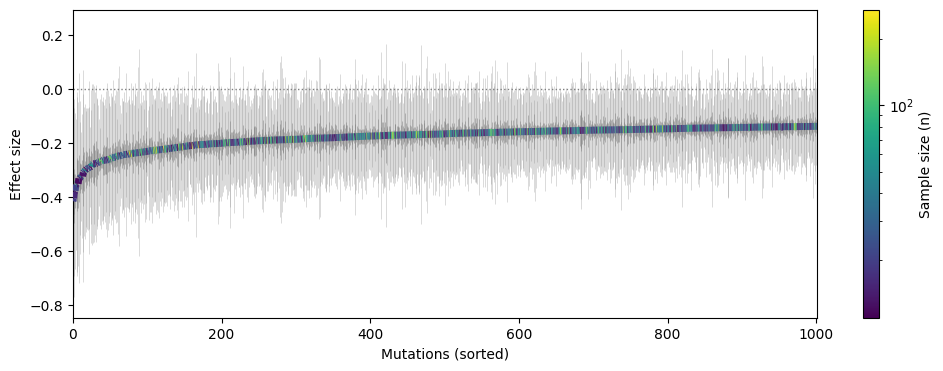

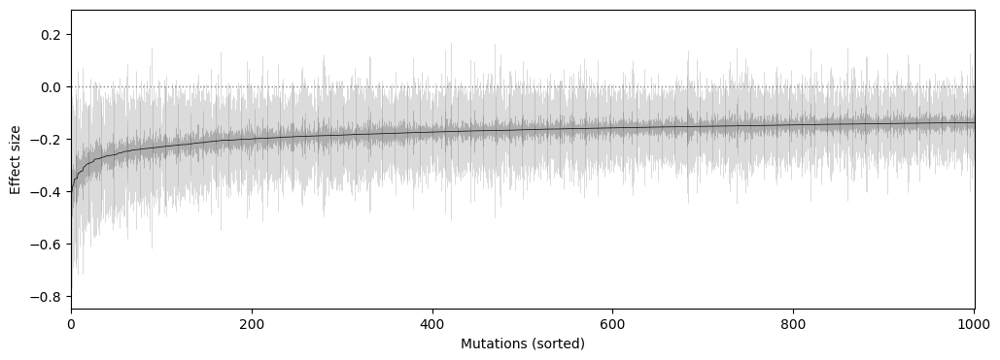

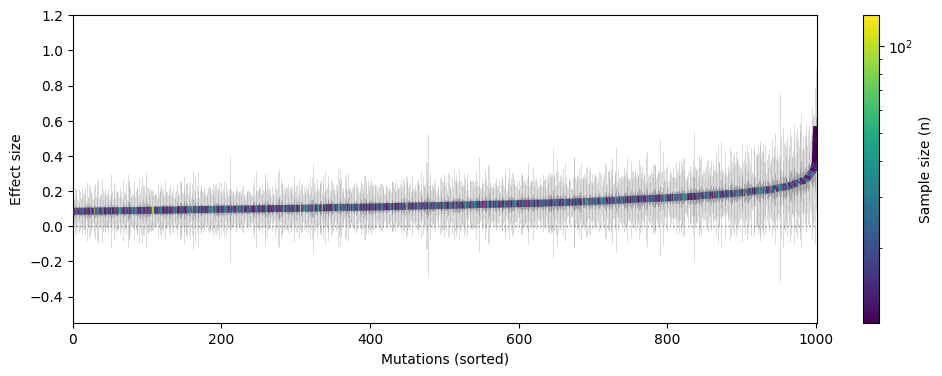

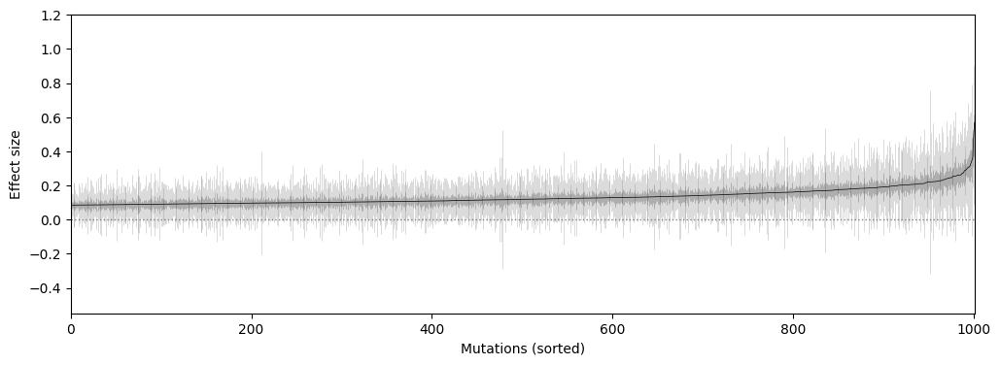

In [ ]:
df = get_tails(
    gram_positive_log2_diff_mean_stats_mutation_stats_df.loc[
        gram_positive_log2_diff_mean_stats_mutation_stats_df["n"] > 10
    ],
    col="mean",
    q=0.05,
)[0]

# With both SEM and STD
plot_colored_effect_line(
    df,
    main_line="colored",
    linewidth=5,
    err_color="grey",
    err_mode="both",
    err_linewidth=0.5,
)

# With both SEM and STD
plot_colored_effect_line(
    df,
    main_line="black",
    linewidth=0.5,
    err_color="grey",
    err_mode="both",
    err_linewidth=0.5,
)


df = get_tails(
    gram_positive_log2_diff_mean_stats_mutation_stats_df.loc[
        mutation_stats_df["n"] > 10
    ],
    col="mean",
    q=0.05,
)[1]

# With both SEM and STD
plot_colored_effect_line(
    df,
    main_line="colored",
    linewidth=5,
    err_color="grey",
    err_mode="both",
    err_linewidth=0.5,
)


plot_colored_effect_line(
    df,
    main_line="black",
    linewidth=0.5,
    err_color="grey",
    err_mode="both",
    err_linewidth=0.5,
)

In [65]:
gram_negative_log2_diff_mean_stats_mutation_stats_df.columns

Index(['index'], dtype='object')

In [103]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


def _normalize_df_for_plot(df, *, mean_col="mean", std_col="std", n_col="n"):
    """
    Make df safe for plotting:
    - if columns are MultiIndex, flatten them
    - strip whitespace from column names
    - ensure required columns exist
    """
    if not hasattr(df, "columns"):
        raise TypeError(f"Expected a DataFrame-like object, got: {type(df)}")

    out = df.copy()

    # flatten MultiIndex columns if needed
    if isinstance(out.columns, pd.MultiIndex):
        out.columns = [
            "_".join([str(x) for x in tup if x is not None and str(x) != ""]).strip()
            for tup in out.columns
        ]

    # normalize column names (stringify + strip)
    out.columns = [str(c).strip() for c in out.columns]

    required = {mean_col, std_col, n_col}
    missing = required - set(out.columns)
    if missing:
        raise KeyError(
            f"Missing required columns {missing}. Available columns: {list(out.columns)}"
        )

    return out


def plot_cdf_like_with_errorbars(
    dfs,
    labels=None,
    sort_by="mean",
    err_mode="sem",  # "sem", "std", or None to disable errorbars
    x_mode="quantile",  # "quantile" or "index"
    ax=None,
    figsize=(12, 4.5),
    linewidth=2.2,
    err_linewidth=1.0,
    err_alpha=0.18,
    line_alpha=0.95,
    capsize=0,
    grid=True,
    legend=True,
    mean_col="mean",
    std_col="std",
    n_col="n",
):
    # normalize input
    if isinstance(dfs, dict):
        labels = list(dfs.keys()) if labels is None else labels
        dfs = list(dfs.values())
    else:
        dfs = list(dfs)
        if labels is None:
            labels = [f"Population {i+1}" for i in range(len(dfs))]

    if ax is None:
        fig, ax = plt.subplots(figsize=figsize, constrained_layout=True)

    if grid:
        ax.grid(True, alpha=0.25)

    ax.axhline(0, color="0.4", linestyle=":", linewidth=1)

    y_min, y_max = np.inf, -np.inf

    for df, label in zip(dfs, labels):
        df = _normalize_df_for_plot(df, mean_col=mean_col, std_col=std_col, n_col=n_col)

        dfp = df.sort_values(sort_by).reset_index(drop=True)
        m = len(dfp)
        if m == 0:
            continue

        y = dfp[mean_col].to_numpy(float)
        std = dfp[std_col].to_numpy(float)

        if err_mode == "sem":
            n = dfp[n_col].to_numpy(float)
            err = np.where(n > 1, std / np.sqrt(n), np.nan)
        elif err_mode == "std":
            err = std
        else:
            err = None

        x = (np.arange(m) + 1) / m if x_mode == "quantile" else np.arange(m)

        (line,) = ax.plot(
            x, y, linewidth=linewidth, alpha=line_alpha, label=label, zorder=3
        )

        if err is not None:
            ok = np.isfinite(err)
            if np.any(ok):
                ax.errorbar(
                    x[ok],
                    y[ok],
                    yerr=err[ok],
                    fmt="none",
                    ecolor=line.get_color(),
                    elinewidth=err_linewidth,
                    alpha=err_alpha,
                    capsize=capsize,
                    zorder=2,
                )

        # bounds
        if err is not None:
            ok2 = np.isfinite(y) & np.isfinite(err)
            if np.any(ok2):
                y_min = min(y_min, np.nanmin(y[ok2] - err[ok2]))
                y_max = max(y_max, np.nanmax(y[ok2] + err[ok2]))
            else:
                y_min = min(y_min, np.nanmin(y))
                y_max = max(y_max, np.nanmax(y))
        else:
            y_min = min(y_min, np.nanmin(y))
            y_max = max(y_max, np.nanmax(y))

    # axes
    if x_mode == "quantile":
        ax.set_xlim(0, 1)
        ax.set_xlabel("Empirical quantile (CDF-like)")
    else:
        ax.set_xlabel("Sorted index")

    ax.set_ylabel("Effect size")

    if not np.isfinite(y_min) or not np.isfinite(y_max) or y_min == y_max:
        y_min, y_max = -1, 1
    pad = 0.08 * (y_max - y_min)
    ax.set_ylim(y_min - pad, y_max + pad)

    if legend:
        ax.legend(frameon=False)

    return ax


# ------------------ DIAGNOSE (prints what you REALLY have) ------------------
print("Gram+ type:", type(gram_positive_log2_diff_mean_stats_mutation_stats_df))
if hasattr(gram_positive_log2_diff_mean_stats_mutation_stats_df, "columns"):
    print(
        "Gram+ columns:",
        list(gram_positive_log2_diff_mean_stats_mutation_stats_df.columns),
    )

print("\nGram- type:", type(gram_negative_log2_diff_mean_stats_mutation_stats_df))
if hasattr(gram_negative_log2_diff_mean_stats_mutation_stats_df, "columns"):
    print(
        "Gram- columns:",
        list(gram_negative_log2_diff_mean_stats_mutation_stats_df.columns),
    )

Gram+ type: <class 'pandas.core.frame.DataFrame'>
Gram+ columns: ['parent', 'mutant', 'mean', 'std', 'n']

Gram- type: <class 'pandas.core.frame.DataFrame'>
Gram- columns: ['parent', 'mutant', 'mean', 'std', 'n']


In [105]:
def filter_df_by_n(df, n_col="n", n_threshold=10):
    return df[df[n_col] > n_threshold]

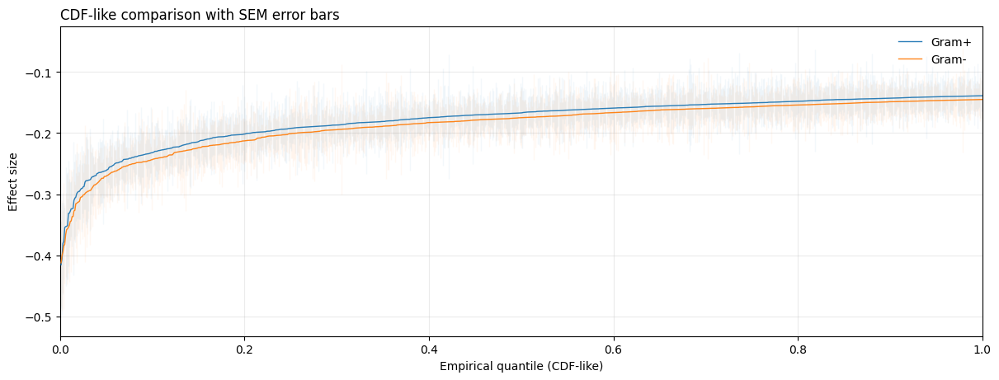

In [108]:
# ------------------ RUN PLOT ------------------
fig, ax = plt.subplots(figsize=(12, 4.5), constrained_layout=True)

plot_cdf_like_with_errorbars(
    {
        "Gram+": get_tails(
            filter_df_by_n(
                gram_positive_log2_diff_mean_stats_mutation_stats_df, n_threshold=10
            ),
            col="mean",
            q=0.05,
        )[0],
        "Gram-": get_tails(
            filter_df_by_n(
                gram_negative_log2_diff_mean_stats_mutation_stats_df, n_threshold=10
            ),
            col="mean",
            q=0.05,
        )[0],
    },
    err_mode="sem",  # "sem", "std", or None to disable errorbars
    x_mode="quantile",
    ax=ax,
    linewidth=1.0,
    mean_col="mean",
    std_col="std",
    n_col="n",
    err_alpha=0.05,
)

ax.set_title("CDF-like comparison with SEM error bars", loc="left")
plt.show()

---

In [112]:
import numpy as np
import matplotlib.pyplot as plt


def plot_mean_vs_std_bubble(
    df,
    mean_col="mean",
    std_col="std",
    n_col="n",
    title="Mutation Statistics: Mean vs Standard Deviation",
    figsize=(10, 8),
    alpha=0.75,
    edgecolor="k",
    linewidth=0.35,
    size_range=(12, 220),  # (min_marker_area, max_marker_area) in points^2
    size_scale="sqrt",  # "sqrt" or "linear"
    legend_ns=None,  # e.g. [26, 116, 291]
    legend_loc="upper right",
    grid=True,
    ax=None,
    label=None,  # optional: show population label in legend
    color=None,  # optional: fix color for a population
):
    # checks
    for c in (mean_col, std_col, n_col):
        if c not in df.columns:
            raise KeyError(f"Missing column '{c}'. Available: {list(df.columns)}")

    x = df[mean_col].to_numpy(dtype=float)
    y = df[std_col].to_numpy(dtype=float)
    n = df[n_col].to_numpy(dtype=float)

    # Clean finite values (FIXED)
    ok = np.isfinite(x) & np.isfinite(y) & np.isfinite(n) & (n > 0)
    x, y, n = x[ok], y[ok], n[ok]

    # size mapping
    smin, smax = size_range
    n_min, n_max = float(np.nanmin(n)), float(np.nanmax(n))

    if n_min == n_max:
        sizes = np.full_like(n, (smin + smax) / 2.0, dtype=float)
    else:
        if size_scale == "sqrt":
            nn = np.sqrt(n)
            a, b = np.sqrt(n_min), np.sqrt(n_max)
        elif size_scale == "linear":
            nn = n
            a, b = n_min, n_max
        else:
            raise ValueError("size_scale must be 'sqrt' or 'linear'")

        t = (nn - a) / (b - a)
        sizes = smin + t * (smax - smin)

    # axes
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize, constrained_layout=True)

    if grid:
        ax.grid(True, alpha=0.28)

    # scatter
    ax.scatter(
        x,
        y,
        s=sizes,
        alpha=alpha,
        edgecolors=edgecolor,
        linewidths=linewidth,
        color=color,  # None -> matplotlib default cycle
        label=label,  # None -> no population legend entry
    )

    # labels (only set title/axes once, ideally from the first call)
    ax.set_xlabel("Mean")
    ax.set_ylabel("Std")

    # bubble legend (sample size) — only add if requested
    if legend_ns is not None:

        def n_to_size(nv):
            nv = float(nv)
            if n_min == n_max:
                return (smin + smax) / 2.0
            if size_scale == "sqrt":
                nnv = np.sqrt(nv)
                a2, b2 = np.sqrt(n_min), np.sqrt(n_max)
            else:
                nnv = nv
                a2, b2 = n_min, n_max
            tt = (nnv - a2) / (b2 - a2)
            return smin + tt * (smax - smin)

        handles = [
            ax.scatter(
                [],
                [],
                s=n_to_size(v),
                alpha=alpha,
                edgecolors=edgecolor,
                linewidths=linewidth,
                color="C0",
            )
            for v in legend_ns
        ]
        labels_ = [f"n={int(v)}" for v in legend_ns]

        ax.legend(handles, labels_, title="Sample size", loc=legend_loc, frameon=True)

    if title is not None:
        ax.set_title(title, fontweight="bold")

    return ax

In [117]:
gram_positive_log2_diff_mean_stats_mutation_stats_df["sem"] = (
    gram_positive_log2_diff_mean_stats_mutation_stats_df["std"]
    / np.sqrt(gram_positive_log2_diff_mean_stats_mutation_stats_df["n"])
)
gram_negative_log2_diff_mean_stats_mutation_stats_df["sem"] = (
    gram_negative_log2_diff_mean_stats_mutation_stats_df["std"]
    / np.sqrt(gram_negative_log2_diff_mean_stats_mutation_stats_df["n"])
)

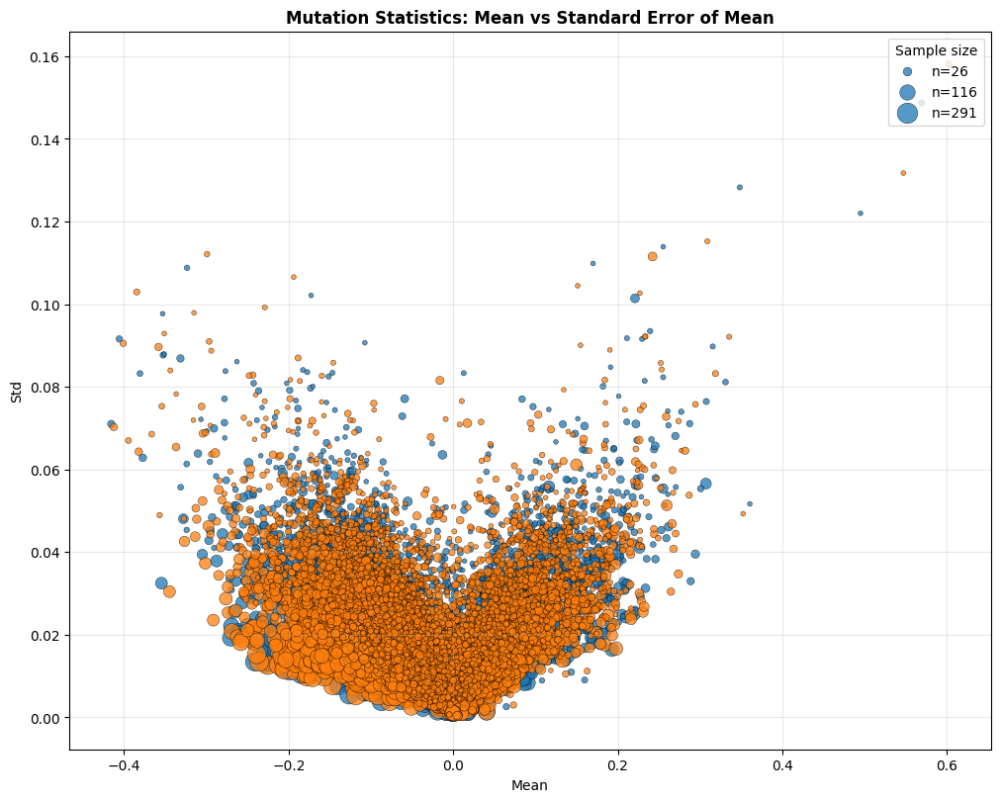

In [121]:
# ------------------ RUN PLOT ------------------
fig, ax = plt.subplots(figsize=(10, 8), constrained_layout=True)

# Prepare data exactly like in your CDF plot
gram_pos_filtered = filter_df_by_n(
    gram_positive_log2_diff_mean_stats_mutation_stats_df,
    n_threshold=10,
)

gram_neg_filtered = filter_df_by_n(
    gram_negative_log2_diff_mean_stats_mutation_stats_df,
    n_threshold=10,
)

# Plot both populations on the same axes
plot_mean_vs_std_bubble(
    gram_pos_filtered,
    title="Mutation Statistics: Mean vs Standard Error of Mean",
    ax=ax,
    legend_ns=[26, 116, 291],  # match your example legend
    std_col="sem",
)

plot_mean_vs_std_bubble(
    gram_neg_filtered,
    ax=ax,
    legend_ns=[26, 116, 291],
    std_col="sem",
)

ax.set_title("Mutation Statistics: Mean vs Standard Error of Mean", fontweight="bold")
plt.show()

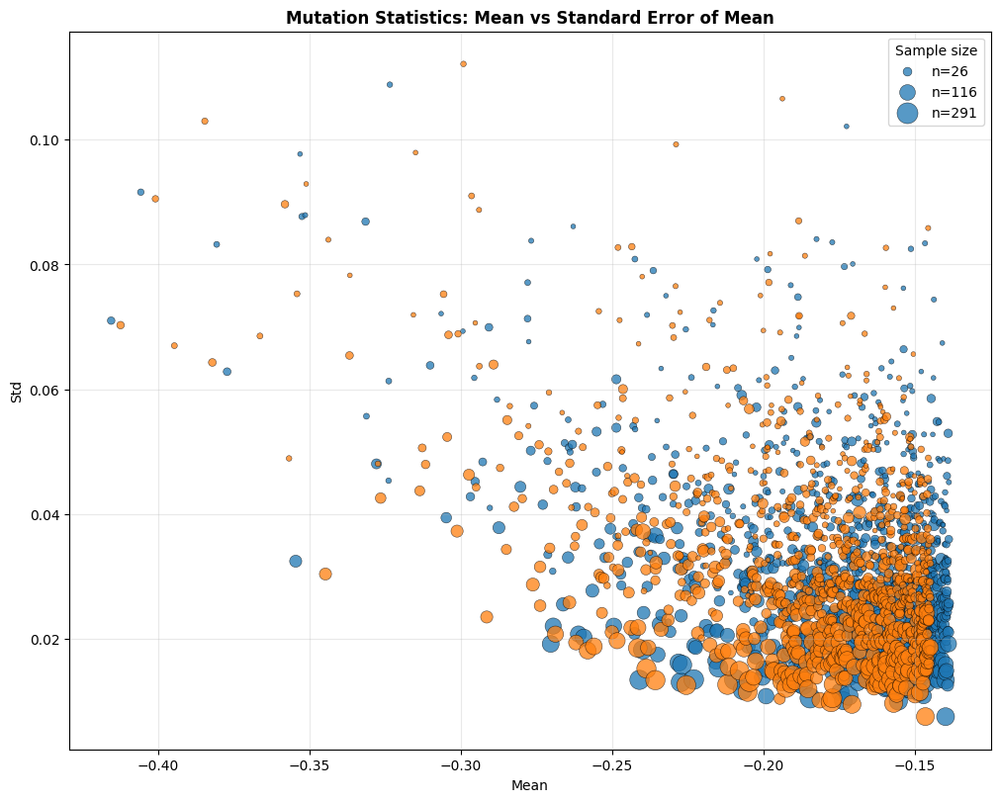

In [123]:
# ------------------ RUN PLOT ------------------
fig, ax = plt.subplots(figsize=(10, 8), constrained_layout=True)

# Prepare data exactly like in your CDF plot
gram_pos_tail = get_tails(
    filter_df_by_n(
        gram_positive_log2_diff_mean_stats_mutation_stats_df,
        n_threshold=10,
    ),
    col="mean",
    q=0.05,
)[0]

gram_neg_tail = get_tails(
    filter_df_by_n(
        gram_negative_log2_diff_mean_stats_mutation_stats_df,
        n_threshold=10,
    ),
    col="mean",
    q=0.05,
)[0]

# Plot both populations on the same axes
plot_mean_vs_std_bubble(
    gram_pos_tail,
    title="Mutation Statistics: Mean vs Standard Deviation",
    ax=ax,
    legend_ns=[26, 116, 291],  # match your example legend
    std_col="sem",
)

plot_mean_vs_std_bubble(
    gram_neg_tail,
    ax=ax,
    legend_ns=[26, 116, 291],
    std_col="sem",
)

ax.set_title("Mutation Statistics: Mean vs Standard Error of Mean", fontweight="bold")
plt.show()

---

In [18]:
# aggregation wrapper is a bottlneck

In [19]:
# import pandas as pd
# from typing import Iterator, Callable, List, Dict


# def aggregate_chunked_dataframe_generator_wrapper(
#     df_iterator: Iterator[pd.DataFrame],
#     agg_dict: Dict[str, List[str]],  # {output_col: [input_cols]}
#     agg_func: Callable,  # Function that takes 2D array of values
#     keep_cols: List[str],
# ) -> Iterator[pd.DataFrame]:
#     """
#     Simple generator wrapper that aggregates columns and keeps only specified columns.

#     Args:
#         df_iterator: Iterator of DataFrames
#         agg_dict: {output_column_name: [input_column_names]} - columns to aggregate
#         agg_func: Function that takes 2D array (rows x cols) and returns aggregated value
#         keep_cols: List of columns to keep in output

#     Yields:
#         DataFrames with aggregated columns and only keep_cols
#     """
#     for chunk_df in df_iterator:
#         # Create a copy of the chunk
#         result_df = chunk_df.copy()

#         # Aggregate columns using .loc and .values
#         for output_col, input_cols in agg_dict.items():
#             # Use .loc to get sub-dataframe and .values to get 2D array
#             values = result_df.loc[:, input_cols].values  # 2D array: (n_rows, n_cols)
#             # Apply aggregation function on 2D array
#             result_df[output_col] = agg_func(values)

#         # Keep only specified columns
#         result_df = result_df[keep_cols]

#         yield result_df

In [20]:
# diff_df_wrapped = iter(
#     aggregate_chunked_dataframe_generator_wrapper(
#         df_iterator=diff_df,
#         agg_dict={
#             "GRAM_POSITIVE_log2_diff_mean": [f"{b}_log2_diff" for b in GRAM_POSITIVE],
#             "GRAM_NEGATIVE_log2_diff_mean": [f"{b}_log2_diff" for b in GRAM_NEGATIVE],
#             "ALL_STRAINS_log2_diff_mean": [
#                 f"{b}_log2_diff" for b in GRAM_POSITIVE + GRAM_NEGATIVE
#             ],
#         },
#         agg_func=lambda x: np.mean(x, axis=1, keepdims=False),
#         keep_cols=[
#             "mutant",
#             "position",
#             "parent",
#             "parent_id",
#             "ALL_STRAINS_log2_diff_mean",
#             "GRAM_POSITIVE_log2_diff_mean",
#             "GRAM_NEGATIVE_log2_diff_mean",
#         ],
#     )
# )


# stats = compute_aggregate_mutation_statistics(
#     diff_df=diff_df_wrapped,
#     parent_col="parent",
#     mutant_col="mutant",
#     value_cols=[
#         "ALL_STRAINS_log2_diff_mean",
#         "GRAM_POSITIVE_log2_diff_mean",
#         "GRAM_NEGATIVE_log2_diff_mean",
#     ],
#     ngram_size=3,
#     use_pbar=True,
# )

---

In [21]:
# stats